<a href="https://colab.research.google.com/github/metsumesquita/kaggle-colab-jupyter/blob/main/ML_WINE.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

importaçoes

In [ ]:
import numpy as np # Manipulação de arrays e uso de funções matemáticas
import pandas as pd # Manipulação de dados em dataframes;
import seaborn as sns # Visualização de dados
import matplotlib.pyplot as plt # Visualização de dados
from sklearn.model_selection import train_test_split # Dividir conjunto de dados em treino e teste
from sklearn.datasets import load_iris, load_wine # Importar as bases de dados iris e wine do scikit-learn
from sklearn.metrics import accuracy_score, plot_confusion_matrix # Métricas para a classificação
from sklearn.preprocessing import MinMaxScaler # Normalização
from sklearn.neural_network import MLPClassifier # MLP

from sklearn.cluster import KMeans # KMEans
from tensorflow.keras.utils import to_categorical# Modificação do vetor de rótulos para dados categóricos


##WINE

##importaçao da base

In [ ]:
wine = load_wine()

print(wine)

{'data': array([[1.423e+01, 1.710e+00, 2.430e+00, ..., 1.040e+00, 3.920e+00,
        1.065e+03],
       [1.320e+01, 1.780e+00, 2.140e+00, ..., 1.050e+00, 3.400e+00,
        1.050e+03],
       [1.316e+01, 2.360e+00, 2.670e+00, ..., 1.030e+00, 3.170e+00,
        1.185e+03],
       ...,
       [1.327e+01, 4.280e+00, 2.260e+00, ..., 5.900e-01, 1.560e+00,
        8.350e+02],
       [1.317e+01, 2.590e+00, 2.370e+00, ..., 6.000e-01, 1.620e+00,
        8.400e+02],
       [1.413e+01, 4.100e+00, 2.740e+00, ..., 6.100e-01, 1.600e+00,
        5.600e+02]]), 'target': array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2,
 

In [ ]:
wine.keys()

dict_keys(['data', 'target', 'target_names', 'DESCR', 'feature_names'])

In [ ]:
wine_df = pd.DataFrame(data=wine['data'], columns=wine['feature_names'])


##descrição

In [ ]:
display(wine_df)

,alcohol,malic_acid,ash,alcalinity_of_ash,magnesium,total_phenols,flavanoids,nonflavanoid_phenols,proanthocyanins,color_intensity,hue,od280/od315_of_diluted_wines,proline
0,14.23,1.71,2.43,15.6,127.0,2.80,3.06,0.28,2.29,5.64,1.04,3.92,1065.0
1,13.20,1.78,2.14,11.2,100.0,2.65,2.76,0.26,1.28,4.38,1.05,3.40,1050.0
2,13.16,2.36,2.67,18.6,101.0,2.80,3.24,0.30,2.81,5.68,1.03,3.17,1185.0
3,14.37,1.95,2.50,16.8,113.0,3.85,3.49,0.24,2.18,7.80,0.86,3.45,1480.0
4,13.24,2.59,2.87,21.0,118.0,2.80,2.69,0.39,1.82,4.32,1.04,2.93,735.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
173,13.71,5.65,2.45,20.5,95.0,1.68,0.61,0.52,1.06,7.70,0.64,1.74,740.0
174,13.40,3.91,2.48,23.0,102.0,1.80,0.75,0.43,1.41,7.30,0.70,1.56,750.0
175,13.27,4.28,2.26,20.0,120.0,1.59,0.69,0.43,1.35,10.20,0.59,1.56,835.0
176,13.17,2.59,2.37,20.0,120.0,1.65,0.68,0.53,1.46,9.30,0.60,1.62,840.0


In [ ]:
wine_df.describe()

,alcohol,malic_acid,ash,alcalinity_of_ash,magnesium,total_phenols,flavanoids,nonflavanoid_phenols,proanthocyanins,color_intensity,hue,od280/od315_of_diluted_wines,proline
count,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000,178.000000
mean,13.000618,2.336348,2.366517,19.494944,99.741573,2.295112,2.029270,0.361854,1.590899,5.058090,0.957449,2.611685,746.893258
std,0.811827,1.117146,0.274344,3.339564,14.282484,0.625851,0.998859,0.124453,0.572359,2.318286,0.228572,0.709990,314.907474
min,11.030000,0.740000,1.360000,10.600000,70.000000,0.980000,0.340000,0.130000,0.410000,1.280000,0.480000,1.270000,278.000000
25%,12.362500,1.602500,2.210000,17.200000,88.000000,1.742500,1.205000,0.270000,1.250000,3.220000,0.782500,1.937500,500.500000
50%,13.050000,1.865000,2.360000,19.500000,98.000000,2.355000,2.135000,0.340000,1.555000,4.690000,0.965000,2.780000,673.500000
75%,13.677500,3.082500,2.557500,21.500000,107.000000,2.800000,2.875000,0.437500,1.950000,6.200000,1.120000,3.170000,985.000000
max,14.830000,5.800000,3.230000,30.000000,162.000000,3.880000,5.080000,0.660000,3.580000,13.000000,1.710000,4.000000,1680.000000


In [ ]:
print("Colunas: ", list(wine_df.columns))

Colunas:  ['alcohol', 'malic_acid', 'ash', 'alcalinity_of_ash', 'magnesium', 'total_phenols', 'flavanoids', 'nonflavanoid_phenols', 'proanthocyanins', 'color_intensity', 'hue', 'od280/od315_of_diluted_wines', 'proline']


In [ ]:
wine['target_names']

array(['class_0', 'class_1', 'class_2'], dtype='<U7')

###teor alcool de cada classe

###dicionário

alcohol=quantidade de alcool

malic_acid=suavizando a acidez, gerando uma sensação amanteigada na boca e aumentando a complexidade dos vinhos

OD280/OD315 of diluted wines: This is a method for determining the protein concentration, which can determine the protein content of various wines.~

'proline'-an amino acid which is a constituent of most proteins, especially collagen.


'color_intensity', 'hue'- cor e intensidade da cor

The alkalinity of the ash is defined as the sum of cations, other than the ammonium ion, combined with the organic acids in the wine.

In [ ]:
wine_df['target_names'] = wine['target']


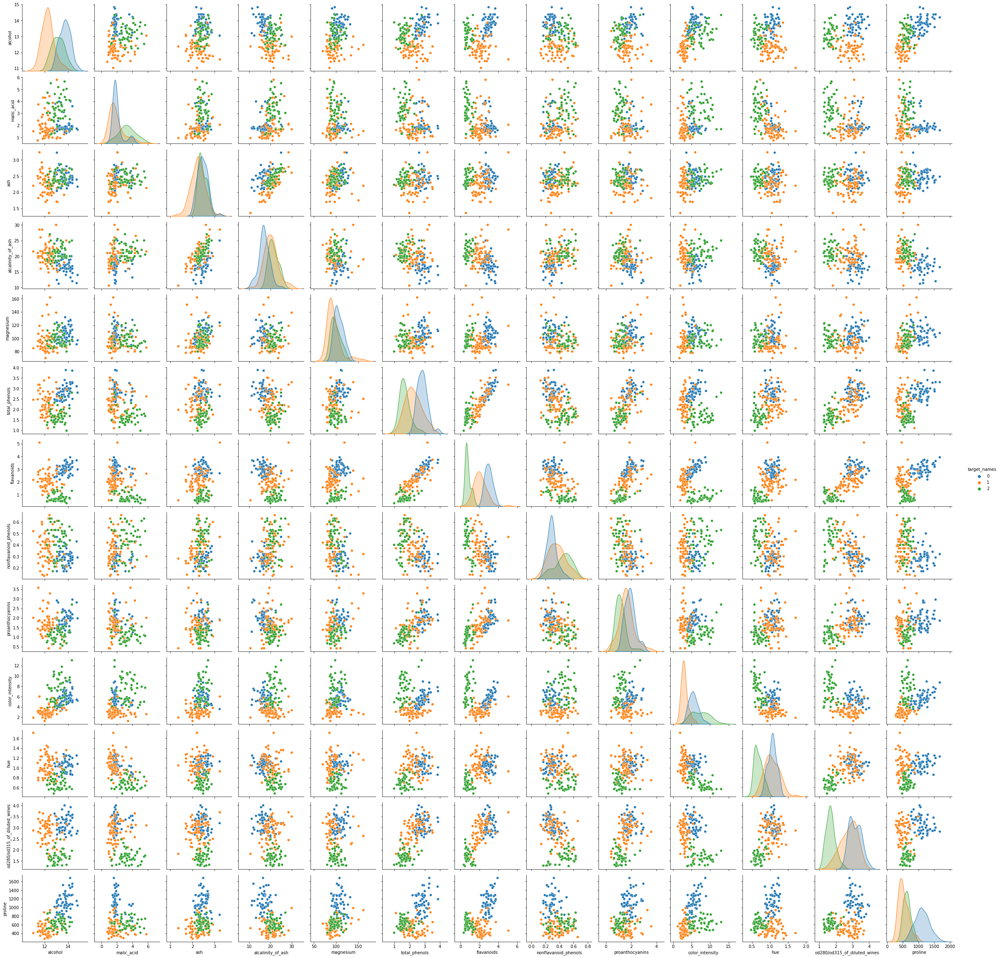

In [ ]:
sns.pairplot(wine_df, hue='target_names', palette='tab10')

In [ ]:
###sns.pairplot(wine_df.drop(columns="target_names"))

 ###Organização da base de dados:

In [ ]:
X = wine['data']

In [ ]:
y = wine['target']

###normalizaçao dos ddos

In [ ]:
##normalizaçao dos dados
X_norm = MinMaxScaler().fit_transform(X)
# Dividindo o array de atributos e o array de rótulos em conjuntos de treino e de teste
X_train, X_test, y_train, y_test = train_test_split(X_norm, y, test_size=0.1)

####Treinar e avaliar o modelo de classificação:

In [ ]:
mlp = MLPClassifier().fit(X_train, y_train)

/usr/local/lib/python3.7/dist-packages/sklearn/neural_network/_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)


In [ ]:
y_prediction = mlp.predict(X_test)

In [ ]:
100*accuracy_score(y_test, y_prediction)
##91.6-1

100.0

##foto

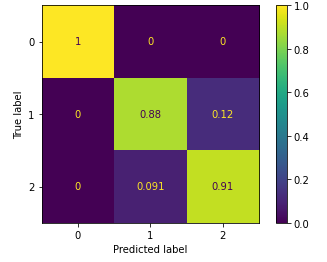

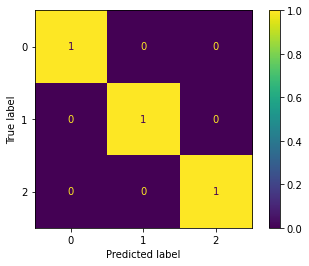

In [ ]:
plot_confusion_matrix(mlp, X_test, y_test, normalize='true')
###lembre das aula de severino e de fazer os desenhos isso vai te ajudar
###observando a tabela de cima veja que houve um alguns erros nos mais ele identificou o 1 como 2 e o 2 como 1
###o mesmo nao acontece na tabela de baixo onde ele acerta 100% daz vezes

In [ ]:
y_train=to_categorical(y_train)
y_test=to_categorical(y_test)

###VISUALIZANDO O PRINT DE TESTES E TREINOS

In [ ]:
print(y_test)

[[0. 0. 1.]
 [0. 0. 1.]
 [0. 1. 0.]
 [0. 0. 1.]
 [0. 0. 1.]
 [0. 1. 0.]
 [1. 0. 0.]
 [0. 0. 1.]
 [0. 0. 1.]
 [0. 1. 0.]
 [0. 1. 0.]
 [0. 0. 1.]
 [1. 0. 0.]
 [1. 0. 0.]
 [0. 1. 0.]
 [1. 0. 0.]
 [0. 0. 1.]
 [0. 1. 0.]]


In [ ]:
##so quero ver isso
print(X_test)

[[0.63684211 0.58498024 0.6631016  0.63917526 0.44565217 0.24827586
  0.12236287 0.56603774 0.33123028 0.80204778 0.30081301 0.10622711
  0.29743224]
 [0.48421053 0.76482213 0.59893048 0.56185567 0.17391304 0.24827586
  0.06540084 0.64150943 0.14195584 0.54351536 0.04878049 0.21611722
  0.24750357]
 [0.64736842 0.18181818 0.47058824 0.69072165 0.18478261 0.31034483
  0.3164557  0.26415094 0.1955836  0.20989761 0.40650407 0.55311355
  0.13837375]
 [0.57894737 0.50592885 0.49197861 0.40721649 0.30434783 0.28275862
  0.10337553 0.90566038 0.46056782 0.7883959  0.06504065 0.08791209
  0.2831669 ]
 [0.39473684 0.94268775 0.68449198 0.74226804 0.2826087  0.27931034
  0.05485232 0.94339623 0.21766562 0.31740614 0.27642276 0.15384615
  0.16904422]
 [0.44473684 0.19960474 0.49197861 0.61340206 0.15217391 0.13793103
  0.29957806 0.66037736 0.38485804 0.17235495 0.32520325 0.42124542
  0.14978602]
 [0.75526316 0.18577075 0.40641711 0.27835052 0.33695652 0.73103448
  0.64345992 0.1509434  0.545741

treinamento y

In [ ]:
y_train

array([[0., 1., 0.],
       [0., 0., 1.],
       [0., 1., 0.],
       [1., 0., 0.],
       [0., 0., 1.],
       [0., 0., 1.],
       [0., 1., 0.],
       [0., 1., 0.],
       [0., 0., 1.],
       [1., 0., 0.],
       [0., 1., 0.],
       [0., 0., 1.],
       [0., 1., 0.],
       [0., 0., 1.],
       [0., 0., 1.],
       [1., 0., 0.],
       [1., 0., 0.],
       [1., 0., 0.],
       [0., 1., 0.],
       [1., 0., 0.],
       [0., 0., 1.],
       [1., 0., 0.],
       [0., 1., 0.],
       [0., 1., 0.],
       [0., 1., 0.],
       [0., 1., 0.],
       [1., 0., 0.],
       [1., 0., 0.],
       [0., 0., 1.],
       [0., 1., 0.],
       [1., 0., 0.],
       [0., 1., 0.],
       [0., 1., 0.],
       [0., 1., 0.],
       [0., 1., 0.],
       [1., 0., 0.],
       [0., 1., 0.],
       [0., 1., 0.],
       [0., 1., 0.],
       [0., 0., 1.],
       [0., 0., 1.],
       [0., 1., 0.],
       [1., 0., 0.],
       [0., 0., 1.],
       [0., 1., 0.],
       [1., 0., 0.],
       [0., 1., 0.],
       [0., 1

In [ ]:
print(X_train)

[[0.35263158 0.08498024 0.29946524 ... 0.5203252  0.80952381 0.16547789]
 [0.50789474 0.53557312 0.52941176 ... 0.16260163 0.17582418 0.2831669 ]
 [0.35263158 0.09288538 0.64171123 ... 0.57723577 0.37728938 0.2853067 ]
 ...
 [0.76578947 0.19565217 0.48663102 ... 0.5203252  0.67032967 0.70042796]
 [0.88157895 0.22332016 0.54545455 ... 0.58536585 0.63369963 0.90513552]
 [0.69473684 0.10079051 0.29946524 ... 0.6097561  0.43589744 0.2510699 ]]


x_norme - print

In [ ]:

X_norm

array([[0.84210526, 0.1916996 , 0.57219251, ..., 0.45528455, 0.97069597,
        0.56134094],
       [0.57105263, 0.2055336 , 0.4171123 , ..., 0.46341463, 0.78021978,
        0.55064194],
       [0.56052632, 0.3201581 , 0.70053476, ..., 0.44715447, 0.6959707 ,
        0.64693295],
       ...,
       [0.58947368, 0.69960474, 0.48128342, ..., 0.08943089, 0.10622711,
        0.39728959],
       [0.56315789, 0.36561265, 0.54010695, ..., 0.09756098, 0.12820513,
        0.40085592],
       [0.81578947, 0.66403162, 0.73796791, ..., 0.10569106, 0.12087912,
        0.20114123]])

###AGRUPAMETNOS

In [ ]:
km=KMeans(n_clusters=4).fit(X_norm)##olhando os graficos parece que um dos grupos é um grupo meio termo/transis
###km=KMeans(n_clusters=3).fit(X_norm)-

In [ ]:
km.labels_

array([3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 0,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 0,
       3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 1, 1, 1, 1, 0, 1, 1,
       0, 1, 1, 1, 1, 0, 1, 3, 0, 1, 1, 1, 1, 0, 1, 0, 1, 2, 0, 1, 1, 1,
       1, 1, 1, 1, 1, 0, 0, 3, 1, 1, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0,
       0, 0, 1, 1, 1, 1, 1, 1, 2, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2], dtype=int32)

In [ ]:
new_wine_df=wine_df.copy()
new_wine_df['target_names']=km.labels_

In [ ]:
print(new_wine_df)

     alcohol  malic_acid  ...  proline  target_names
0      14.23        1.71  ...   1065.0             3
1      13.20        1.78  ...   1050.0             3
2      13.16        2.36  ...   1185.0             3
3      14.37        1.95  ...   1480.0             3
4      13.24        2.59  ...    735.0             3
..       ...         ...  ...      ...           ...
173    13.71        5.65  ...    740.0             2
174    13.40        3.91  ...    750.0             2
175    13.27        4.28  ...    835.0             2
176    13.17        2.59  ...    840.0             2
177    14.13        4.10  ...    560.0             2

[178 rows x 14 columns]


###pairplot com os dados normalizados

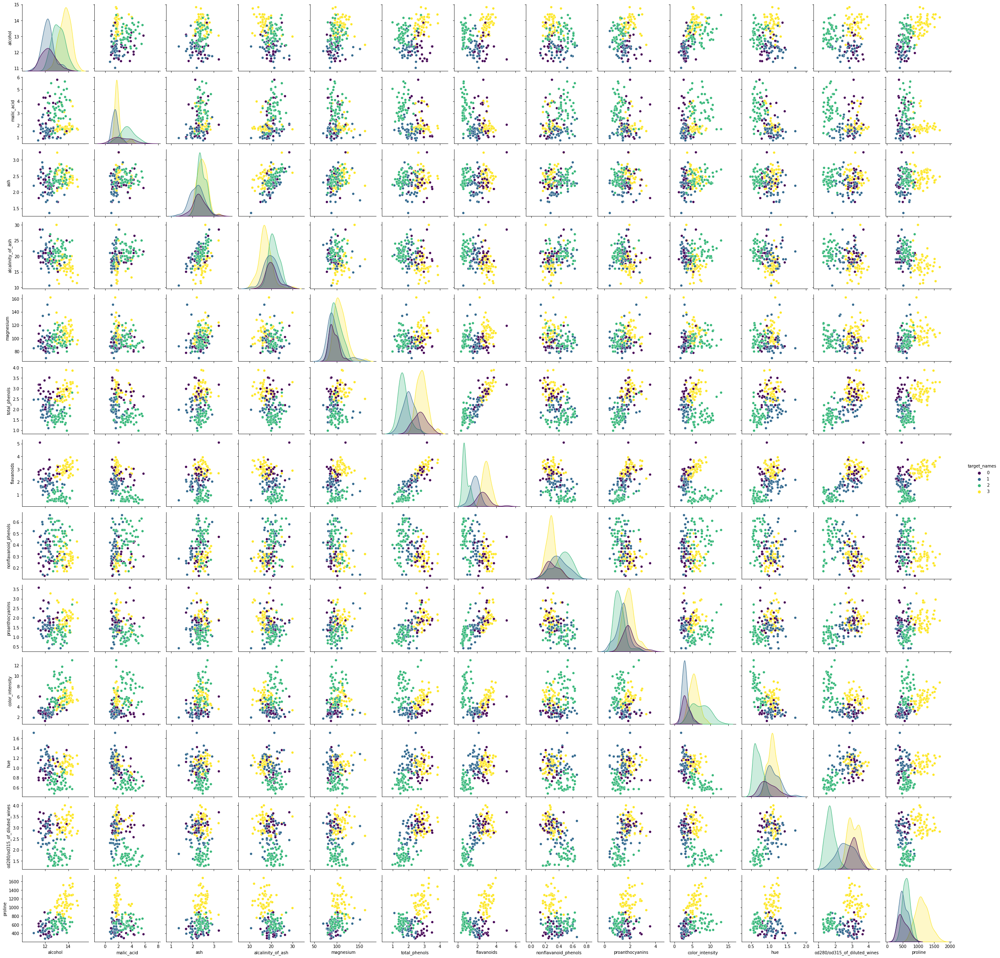

In [ ]:
sns.pairplot(new_wine_df,hue="target_names",palette='viridis')

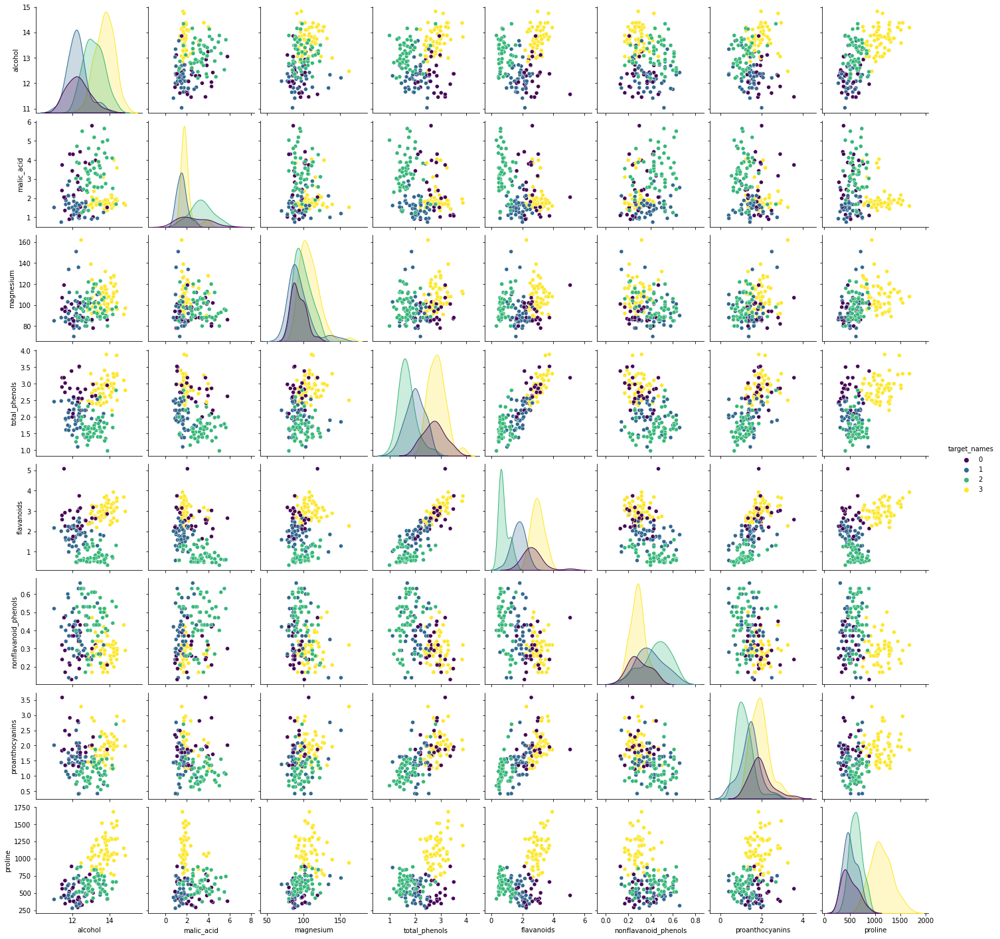

In [ ]:
sns.pairplot(new_wine_df.drop(columns=[ 'ash', 'alcalinity_of_ash', 'color_intensity', 'hue', 'od280/od315_of_diluted_wines' ]),hue='target_names', palette='viridis')
plt.show()

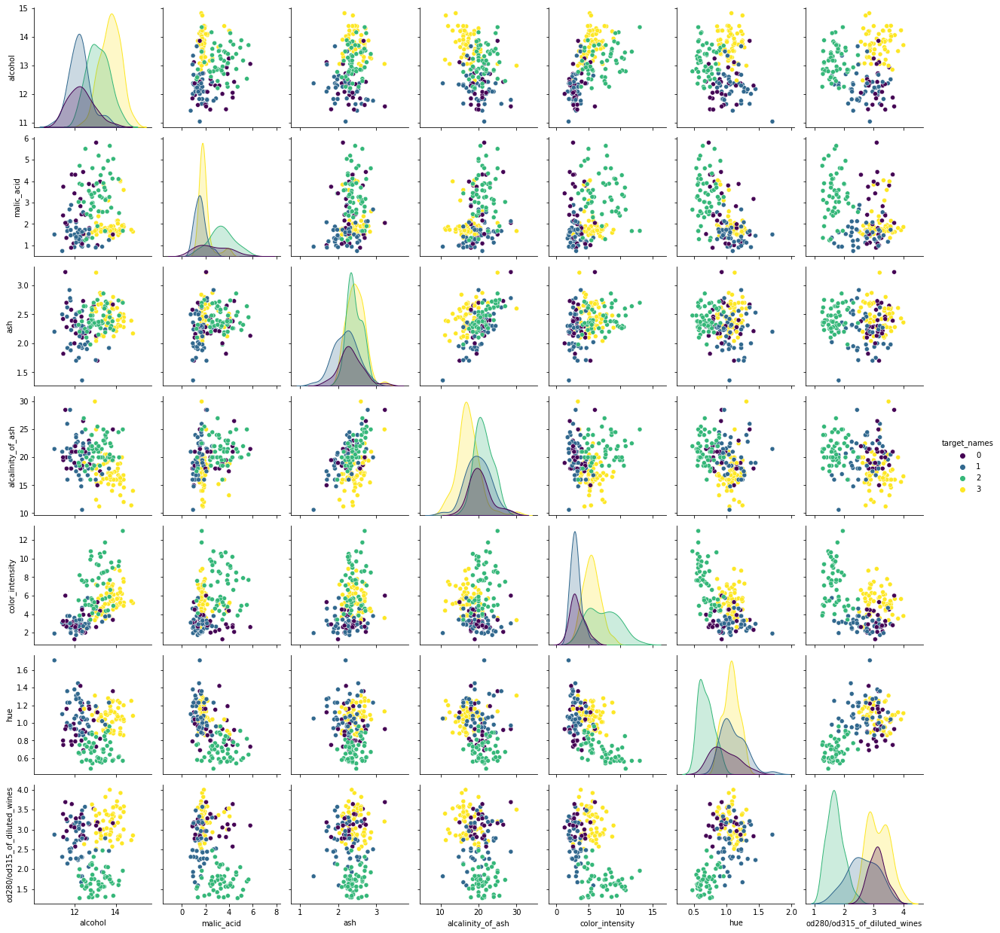

In [ ]:
sns.pairplot(new_wine_df.drop(columns=['magnesium', 'total_phenols', 'flavanoids', 'nonflavanoid_phenols','proanthocyanins', 'proline']),hue="target_names", palette='viridis')
plt.show()

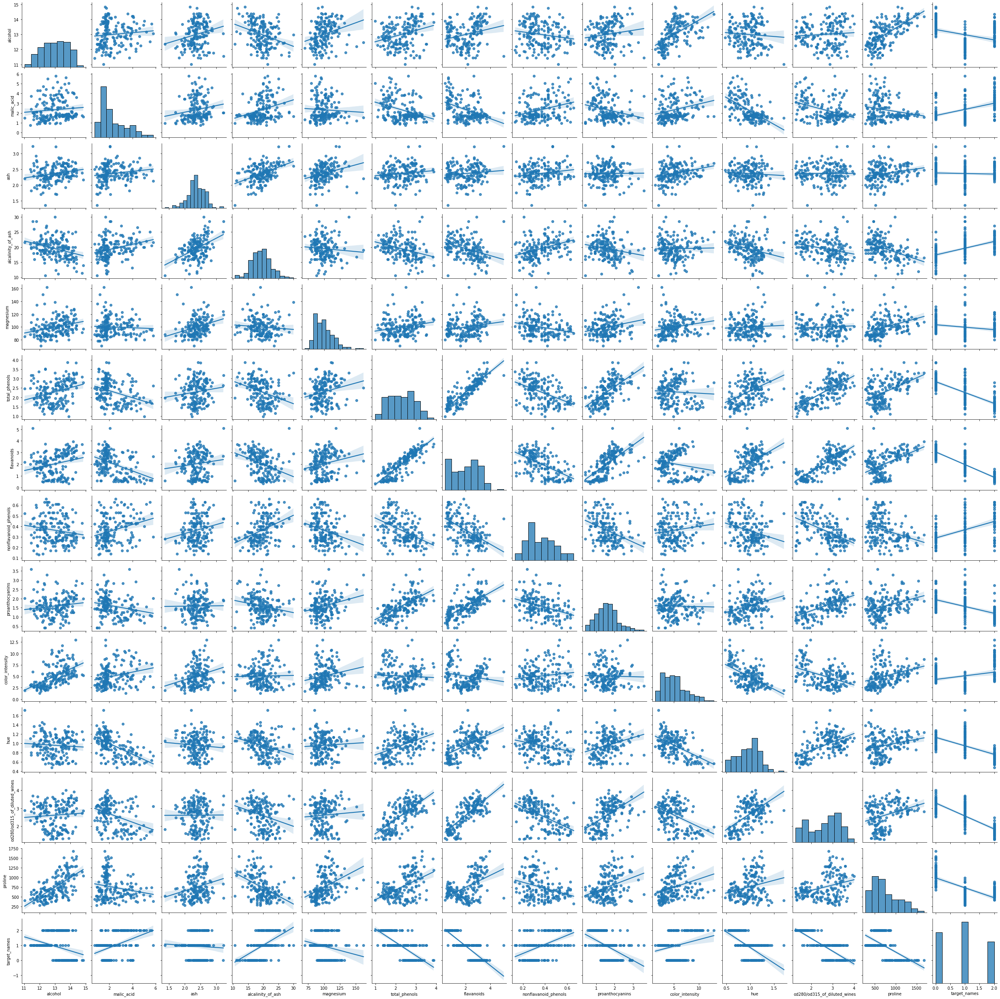

In [ ]:
 ###Obs: Exemplo de visualização com regressão
sns.pairplot(wine_df, palette='tab10', kind='reg')

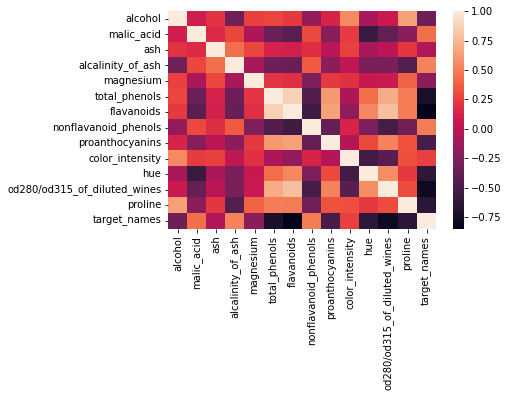

In [ ]:
# Exemplo de visualização de mapa de calor de correlação
sns.heatmap(wine_df.corr());